# **Data Analysis**

In order to give comperhensive key recommendations to the new airbnb partners (new listing providers), we conduct our analysis based on several persepectives
consisting of

* **Analysis of listing pattern - neighbourhood and room types**, The aim of this analysis is mainly to provide the understanding of the current competition between airbnb listing partners based on neighbourhood and room types. Hopefully, by presenting the result of analysis, the new airbnb Partners in Bangkok can understand whether they will compete in highly competitive neighbourhood or not and whether their choosen listings type (room type) are the most common or not. 
* **Analysis of listing price pattern**, the aim of this analysis is to analyze price data and provide information of the market price of listing based on the location of neighbourhoods and room type. So, the new airbnb partners can make informed decision in formulating their own pricing strategy.
* **Analysis of listing popularity pattern**, the aim of this analysis is to compare which feature catgories that resulted in high number of reviews. The number of review generated from listing will be compared based on feature such as room type, neighbourhood, price, etc. By benefiting from this information, hopefully the new airbnb partners can optimize their listing for gaining more reviews. 
* **Analysis of listing promotional language**, the aim of this analysis is to compare the use of English and Non-English in providing listing description. We examine some parameters like the number of of reviews that is generated and price comparison between English and Non-English listing. By utilizing this information, the new airbnb partners can make informed decision for preparing listing description to aim their target markets.
* **Analysis of the most frequent words or terms**, the aim of this analysis is to find the most used terms that can be used by airbnb partners for future inspiration in formulating effective listing description and marketing.


## **Analysis of listing pattern - neighbourhood and room types**
To formulate insights and recommendations, we need to know the current situation of listing patterns in Bangkok. Some features that we need to asses for this analysis consist of listing locations in the neighbourhood, room types, and geographic maps (via folium). For this analysis, We have some questions that consist of:
* What are the current listing distribution of airbnb in Bangkok? which area of Bangkok has the high number of listings and which are not?
* What are the composition of room type of airbnb in Bangkok? which one is the most common?
* Is there any association between neighbourhood location and listing room type?

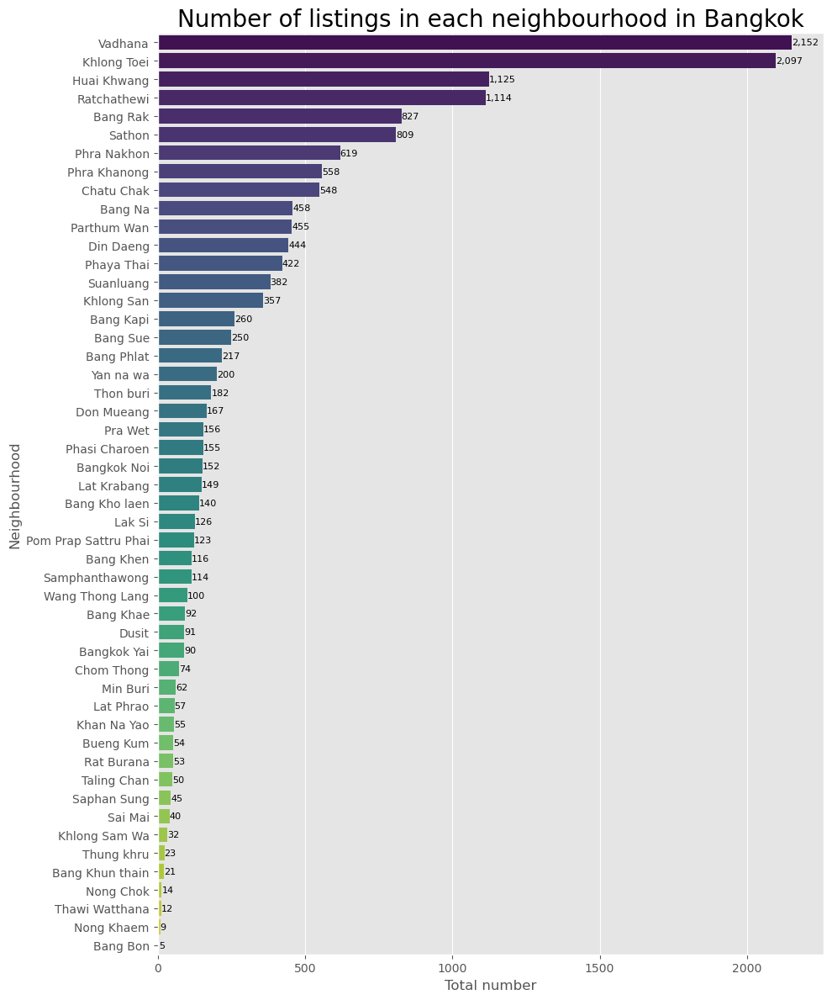

In [83]:
# Number of listings in neighbourhood in Bangkok

# Calculating the total listing number per neighbourhood location and sorting the order based on the number
df_neighbourhood = df['neighbourhood'].value_counts().sort_values(ascending=False)

# Creating bar chart
plt.figure(figsize=(10, 12))
ax = sns.barplot(x=df_neighbourhood.values, y=df_neighbourhood.index, palette='viridis')

# Function for annotating bar chart
def annotate_bars(ax):
    for bar in ax.patches:
        x, y = bar.get_width(), bar.get_y() + bar.get_height() / 2
        ax.text(
            x, y, f'{bar.get_width():,.0f}', 
            va='center', ha='left', color='black', fontsize=8
        )
    return ax


# Adding title and labels
plt.title('Number of listings in each neighbourhood in Bangkok', fontsize=20)
plt.xlabel('Total number')
plt.ylabel('Neighbourhood')

# Displaying bar chart
annotate_bars(ax)
plt.tight_layout()
plt.show()

Based on our data, the highest number of listings are located in the neigbourhood of Vadhana (1st rank) and Khlong Toei (2nd rank). Both of these neighebourhoods are almost two times higher than Huai Khwang (3rd rank) and Ratchathewi (4th rank) in the number of listings. The other neighbourhood with high number of listings are from Bang Rak, Sathon, Phra Nakhon, Phra Khanong, Chatu Chak.

In [85]:
# Displaying the map and number of listing 


# Creating Bangkok map with boundary
bangkok_map = folium.Map(
    location=[13.7563, 100.5018],
    zoom_start=12,
    tiles='https://cartodb-basemaps-{s}.global.ssl.fastly.net/light_all/{z}/{x}/{y}{r}.png',
    attr='Map data &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors | Tiles &copy; <a href="https://carto.com/attributions">CARTO</a>',
    max_bounds=True,
    min_zoom=10, 
    max_bounds_viscosity=1.0,
    max_zoom=15,  
    max_bounds_readable=True  
)

# Coordinate boundary of Bangkok
bangkok_bounds = [[13.5, 100.25], [14.0, 100.9]]

# Adding map boundary as limitation for Bangkok area
folium.Rectangle(
    bounds=bangkok_bounds,
    fill=False,
    color='blue',
    weight=2,
    fill_opacity=0
).add_to(bangkok_map)

# Initiating MarkerCluster
listings = plugins.MarkerCluster().add_to(bangkok_map)

# Attaching marker to MarkerCluster
for lat, long, label in list(zip(df['latitude'], df['longitude'], df['room_type'])):
    folium.Marker(
        [lat, long],
        popup=label,
        icon=None
    ).add_to(listings)
    
# Adding markers for infamous locations in Bangkok
folium.Marker([13.7445, 100.4966], popup='Sukhumvit', icon=folium.Icon(icon='building', prefix='fa', color='red')).add_to(bangkok_map) # Most central area, Shopping centers, dining/restaurants, bars and many excellent accomodation. Near to BTS sky train.
folium.Marker([13.7233, 100.4762], popup='Siam', icon=folium.Icon(icon='building', prefix='fa', color='red')).add_to(bangkok_map) # Famous shopping malls (Siam Square and Central World), tourist attractions like Siam ocean World (aquarium), Madame Tusssaud's Wax museum. Near to BTS sky train
folium.Marker([13.7249, 100.493], popup='Silom', icon=folium.Icon(icon='building', prefix='fa', color='red')).add_to(bangkok_map) # Financial district, many bank headquarters, financial institutions & offices. Hundreds of restaurant and foodsthalls. Near MRT subway, BTS sky train.
folium.Marker([13.7314, 100.5148], popup='Ratchathewi', icon=folium.Icon(icon='building', prefix='fa', color='red')).add_to(bangkok_map) # Distric in central Bangkok, access to BTS skytrain, access to International airport (via Makkasan), Bangkok landmark 

# Adding markers for airports in Bangkok
folium.Marker([13.6902, 100.7501], popup='Suvarnabhumi Airport', icon=folium.Icon(icon='plane', prefix='fa', color='orange')).add_to(bangkok_map) # airport
folium.Marker([13.9129, 100.6077], popup='Don Mueang', icon=folium.Icon(icon='plane', prefix='fa', color='orange')).add_to(bangkok_map) # airport



# Displaying map
bangkok_map

To be continued to the data analysis part 2